In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cafa-5-pdbs/test/AF-Q90415-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-O82343-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q9NP50-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q46806-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q554M9-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P21565-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P76484-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q3ZBS8-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q68A92-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P55317-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q58548-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q9Z0H8-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P0DMN7-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P0CF67-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q17RA5-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-P83436-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/AF-Q9LSF6-F1-model_v4.pdb
/kaggle/input/cafa-5-pdbs/test/

In [3]:
pip install biopython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 31.3 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import Bio
print(Bio.__version__)

1.84


## Reading PDB files

In [5]:
from Bio.PDB.PDBParser import PDBParser

parser=PDBParser(PERMISSIVE=1)

In [7]:
structure_id='test_protein'
filename='/kaggle/input/cafa-5-pdbs/test/AF-A0A023PXA5-F1-model_v4.pdb'
structure=parser.get_structure(structure_id, filename)

## Header

In [15]:
resolution = structure.header["resolution"]
name=structure.header['name']
print(name)

alphafold monomer v2.0 prediction for putative uncharacterized protein yal019w-a (a0a023pxa5)


In [16]:
# to get the whole dict with the header in one shot
from Bio.PDB import parse_pdb_header
with open(filename, "r") as handle:
    header_dict = parse_pdb_header(handle)

In [13]:
header_dict

{'name': 'alphafold monomer v2.0 prediction for putative uncharacterized protein yal019w-a (a0a023pxa5)',
 'head': '01-jun-22',
 'idcode': '',
 'deposition_date': '2022-06-01',
 'release_date': '1909-01-08',
 'structure_method': 'unknown',
 'resolution': None,
 'structure_reference': ['john jumper, richard evans, alexander pritzel, tim grmichael figurnov, olaf ronneberger, kathryn tunyasuvuruss bates, augustin zidek, anna potapenko, alex bridclemens meyer, simon a a kohl, andrew j ballard, andrew cowie, bernardino romera-paredes, stanislav nirishub jain, jonas adler, trevor back, stig petersen,david reiman, ellen clancy, michal zielinski, martin steinegger, michalina pacholska, tamas berghamdavid silver, oriol vinyals, andrew w senior, koray kavukcuoglu, pushmeet kohli, demis hassabis highly accurate protein structure prediction with alpnature v. 596 583 2021 issn 0028-0836 34265844 10.1038/s41586-021-03819-2 ers d data, copyright (2021) deepmind technologies limiteion provided is theo

## The structure

The overall layout of a Structure object follows the so-called SMCRA (Structure/Model/Chain/Residue/Atom) architecture:

A structure consists of models

A model consists of chains

A chain consists of residues

A residue consists of atoms

This is the way many structural biologists/bioinformaticians think about structure, and provides a simple but efficient way to deal with structure.

Structure, Model, Chain and Residue are all subclasses of the Entity base class. The Atom class only (partly) implements the Entity interface (because an Atom does not have children).

In general, a child Entity object (i.e. Atom, Residue, Chain, Model) can be extracted from its parent (i.e. Residue, Chain, Model, Structure, respectively) by using an id as a key.

In [18]:
# some operations with parent / child entities 

#child_entity=parent_entity['child_id']
#child_list = parent_entity.get_list()
#parent_entity = child_entity.get_parent()


The id of the Model object is an integer, which is derived from the position of the model in the parsed file (they are automatically numbered starting from 0). Crystal structures generally have only one model (with id 0), while NMR files usually have several models. Whereas many PDB parsers assume that there is only one model, the Structure class in Bio.PDB is designed such that it can easily handle PDB files with more than one model.

As an example, to get the first model from a Structure object, use

In [21]:
first_model=structure[0]

In [26]:
chain_A=first_model['A']

In [30]:
# Full id
residue = chain_A[(" ", 100, " ")]
# Shortcut id
residue = chain_A[100]

print(residue)

<Residue HIS het=  resseq=100 icode= >


In [33]:
# use full id
res10 = chain_A[(" ", 10, " ")]
# use shortcut
res10 = chain_A[10]

print(res10)

<Residue ALA het=  resseq=10 icode= >


In [36]:
# A residue object has a series of methods associated 

name='C'
print(residue.get_resname())  # returns the residue name, e.g. "ASN"
print(residue.is_disordered())  # returns 1 if the residue has disordered atoms
print(residue.get_segid())  # returns the SEGID, e.g. "CHN1"
print(residue.has_id(name))  # test if a residue has a certain atom

HIS
0
    
True


In [42]:
# Does not work alone, to be checked 

# is_aa(residue)

In [48]:
a=residue['N']

In [50]:
print(a.get_name())  # atom name (spaces stripped, e.g. "CA")
print(a.get_id())  # id (equals atom name)
print(a.get_coord())  # atomic coordinates
print(a.get_vector())  # atomic coordinates as Vector object
print(a.get_bfactor())  # isotropic B factor
print(a.get_occupancy())  # occupancy
print(a.get_altloc())  # alternative location specifier
print(a.get_sigatm())  # standard deviation of atomic parameters
print(a.get_siguij())  # standard deviation of anisotropic B factor
print(a.get_anisou())  # anisotropic B factor
print(a.get_fullname())  # atom name (with spaces, e.g. ".CA.")

N
N
[ 0.701  2.581 -4.945]
<Vector 0.70, 2.58, -4.95>
60.65
1.0
 
None
None
None
 N  


## Example 

In [51]:
model = structure[0]
chain = model["A"]
residue = chain[100]
atom = residue["CA"]

In [52]:
# shortcut

atom = structure[0]["A"][100]["CA"]

## Getting all together, parse a PDB-object and retrieve the elements

In [54]:
from Bio.PDB.PDBParser import PDBParser
parser = PDBParser()
structure = parser.get_structure("test", "/kaggle/input/cafa-5-pdbs/test/AF-A0A023PXB9-F1-model_v4.pdb")
model = structure[0]
chain = model["A"]
residue = chain[1]
atom = residue["CA"]

### Iterating through all atoms of a structure

In [55]:
p = PDBParser()
structure = p.get_structure("X", "/kaggle/input/cafa-5-pdbs/test/AF-A0A023PXB5-F1-model_v4.pdb")
for model in structure:
    for chain in model:
        for residue in chain:
            for atom in residue:
                print(atom)


<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG>
<Atom SD>
<Atom CE>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG>
<Atom CD1>
<Atom CD2>
<Atom CE1>
<Atom CE2>
<Atom CZ>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG>
<Atom CD1>
<Atom CD2>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG1>
<Atom CG2>
<Atom CD1>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG1>
<Atom CG2>
<Atom CD1>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom OG>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom OG>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG>
<Atom CD>
<Atom CE>
<Atom NZ>
<Atom N>
<Atom CA>
<Atom C>
<Atom O>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG>
<Atom CD>
<Atom CE>
<Atom NZ>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom CG2>
<Atom OG1>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>
<Atom O>
<Atom OG>
<Atom N>
<Atom CA>
<Atom C>
<Atom O>
<Atom N>
<Atom CA>
<Atom C>
<Atom CB>


In [56]:
# Iterating over residues of a model

residues = model.get_residues()
for residue in residues:
    print(residue)

<Residue MET het=  resseq=1 icode= >
<Residue PHE het=  resseq=2 icode= >
<Residue ALA het=  resseq=3 icode= >
<Residue LEU het=  resseq=4 icode= >
<Residue ILE het=  resseq=5 icode= >
<Residue ILE het=  resseq=6 icode= >
<Residue SER het=  resseq=7 icode= >
<Residue SER het=  resseq=8 icode= >
<Residue LYS het=  resseq=9 icode= >
<Residue GLY het=  resseq=10 icode= >
<Residue LYS het=  resseq=11 icode= >
<Residue THR het=  resseq=12 icode= >
<Residue SER het=  resseq=13 icode= >
<Residue GLY het=  resseq=14 icode= >
<Residue PHE het=  resseq=15 icode= >
<Residue PHE het=  resseq=16 icode= >
<Residue PHE het=  resseq=17 icode= >
<Residue ASN het=  resseq=18 icode= >
<Residue SER het=  resseq=19 icode= >
<Residue SER het=  resseq=20 icode= >
<Residue PHE het=  resseq=21 icode= >
<Residue SER het=  resseq=22 icode= >
<Residue SER het=  resseq=23 icode= >
<Residue SER het=  resseq=24 icode= >
<Residue ALA het=  resseq=25 icode= >
<Residue LEU het=  resseq=26 icode= >
<Residue VAL het=  re

In [61]:
from Bio.PDB import PDBParser, Selection

# Use Selection to get a list of residues
res_list = Selection.unfold_entities(structure, "R")

In [63]:
# For a specific chain

atom_list = Selection.unfold_entities(chain, "A")

A=atom, R=residue, C=chain, M=model, S=structure. You can use this to go up in the hierarchy, e.g. to get a list of (unique) Residue or Chain parents from a list of Atoms

In [65]:
residue_list = Selection.unfold_entities(atom_list, "R")
chain_list = Selection.unfold_entities(atom_list, "C")

In [72]:
from Bio.PDB import PDBParser, PPBuilder

model_nr = 0

# Initialize the PPBuilder instance
ppb = PPBuilder()

# Build peptides for the model
polypeptide_list = ppb.build_peptides(structure[model_nr])
for polypeptide in polypeptide_list:
    print(polypeptide)

<Polypeptide start=1 end=102>


In [74]:
# Using C-N
ppb = PPBuilder()
for pp in ppb.build_peptides(structure):
    print(pp.get_sequence())

MFALIISSKGKTSGFFFNSSFSSSALVGIAPLTAYSALVTPVFKSFLVILPAGLKSKSFAVNTPFKSCWCVIVMCSYFFCVYHLQKQHYCGAPSLYSYLLCL


# Internal coordinates 

In [75]:
from Bio.PDB.PDBParser import PDBParser
from Bio.PDB.Chain import Chain
from Bio.PDB.internal_coords import *
from Bio.PDB.PICIO import write_PIC, read_PIC, read_PIC_seq
from Bio.PDB.ic_rebuild import write_PDB, IC_duplicate, structure_rebuild_test
from Bio.PDB.SCADIO import write_SCAD
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio.PDB.PDBIO import PDBIO
import numpy as np

In [76]:
parser=PDBParser()
myProtein=parser.get_structure('pyk2', '/kaggle/input/cafa-5-pdbs/test/AF-A0A023PYK2-F1-model_v4.pdb')
myChain=myProtein[0]['A']

In [77]:
# Computing bond lengths, angles, dihedral angles

myChain.atom_to_internal_coordinates(verbose=True)

In [78]:
IC_Chain.MaxPeptideBond = 4.0
myChain.internal_coord = None  # force re-loading structure data with new cutoff
myChain.atom_to_internal_coordinates(verbose=True)

In [80]:
r2 = myChain.child_list[1]
print(r2)


<Residue THR het=  resseq=2 icode= >


In [81]:
r2ic = r2.internal_coord
print(r2ic, ":", r2ic.pretty_str(), ":", r2ic.rbase, ":", r2ic.lc)

('pyk2', 0, 'A', (' ', 2, ' ')) : THR  2  : (2, None, 'T') : T


In [82]:
r2chi1 = r2ic.get_angle("chi1")
print(round(r2chi1, 2))

-36.48


In [83]:
r2ic.get_angle("chi1") == r2ic.get_angle("N:CA:CB:CG")

False

In [84]:
print(round(r2ic.get_angle("tau"), 2))

108.36


In [85]:
r2ic.get_angle("tau") == r2ic.get_angle("N:CA:C")

True

In [86]:
print(round(r2ic.get_length("CA:CB"), 2))

1.55


### Another way: 

In [87]:
myCic = myChain.internal_coord

r2chi1_object = r2ic.pick_angle("chi1")
# or same thing (as for get_angle() above):
r2chi1_object == r2ic.pick_angle("N:CA:CB:CG")

False

In [88]:
r2chi1_key = r2chi1_object.atomkeys
r2chi1_key  # r2chi1_key is tuple of AtomKeys

(2_T_N, 2_T_CA, 2_T_CB, 2_T_OG1)

In [90]:
r2chi1_index = myCic.dihedraNdx[r2chi1_key]
print(round(myCic.dihedraAngle[r2chi1_index], 2))

-36.48


In [91]:
r2chi1_object == myCic.dihedra[r2chi1_key]

True

In [92]:
# hedra angles are similar:
r2tau = r2ic.pick_angle("tau")
print(round(myCic.hedraAngle[r2tau.ndx], 2))

108.36


In [93]:
# check myChain makes sense (can get angles and rebuild same structure)
resultDict = structure_rebuild_test(myChain)
resultDict["pass"]

True

## Rebuilding a structure

In [94]:
myChain.internal_to_atom_coordinates()

In [95]:
# just for proof:
myChain.internal_coord = None  # all internal_coord data removed, only atoms left
myChain.atom_to_internal_coordinates()  # re-generate internal coordinates
r2ic = myChain.child_list[1].internal_coord
print(round(r2ic.get_angle("chi1"), 2))  # show measured values match what was set above

-36.48


In [97]:
write_PDB(myProtein, "myChain.pdb")
# or just the ATOM records without headers:
io = PDBIO()
io.set_structure(myProtein)
io.save("myChain2.pdb")

## Accessing the all-atom AtomArray

In [99]:
# access the array of all atoms for the chain, e.g. r2 above is residue 152 C-beta
r2_cBeta_index = myChain.internal_coord.atomArrayIndex[AtomKey("2_T_CB")]
r2_cBeta_coords = myChain.internal_coord.atomArray[r2_cBeta_index]
print(np.round(r2_cBeta_coords, 2))

[-47.19  -5.78  50.63   1.  ]


In [100]:
# the Biopython Atom coord array is now a view into atomArray, so
assert r2_cBeta_coords[1] == r2["CB"].coord[1]
r2_cBeta_coords[1] += 1.0  # change the Y coord 1 angstrom
assert r2_cBeta_coords[1] == r2["CB"].coord[1]
# they are always the same (they share the same memory)
r2_cBeta_coords[1] -= 1.0  # restore

In [104]:
# Extract atom coordinates into a list
atoms = []
for atom in structure.get_atoms():
    atoms.append(atom.get_coord())  # Get the [x, y, z] coordinates of each atom

# Convert list to a NumPy array
atomArray = np.array(atoms)

# Now you can perform the norm operation
distances = np.linalg.norm(atomArray[:, None, :] - atomArray[None, :, :], axis=-1)

print(distances)

[[ 0.         1.4789331  2.4125931 ... 33.547134  34.83156   33.06342  ]
 [ 1.4789331  0.         1.5131509 ... 32.689903  33.9676    32.102856 ]
 [ 2.4125931  1.5131509  0.        ... 32.919327  34.10645   32.07328  ]
 ...
 [33.547134  32.689903  32.919327  ...  0.         2.471319   5.65284  ]
 [34.83156   33.9676    34.10645   ...  2.471319   0.         4.4002767]
 [33.06342   32.102856  32.07328   ...  5.65284    4.4002767  0.       ]]


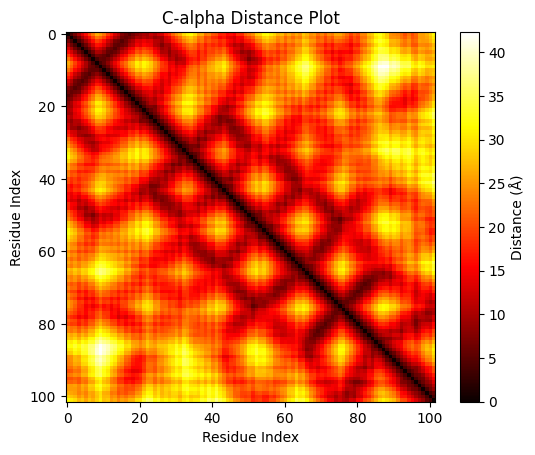

In [108]:
import matplotlib.pyplot as plt
# Initialize a list to hold C-alpha coordinates
ca_atoms = []

# Iterate through the structure to collect C-alpha atoms
for model in structure:
    for chain in model:
        for residue in chain:
            if is_aa(residue):  # Ensure it is an amino acid
                if "CA" in residue:  # Check if the C-alpha atom exists
                    ca = residue["CA"]  # Get the C-alpha atom
                    ca_atoms.append(ca.get_coord())  # Append its coordinates

# Convert list of C-alpha coordinates to a NumPy array
caArray = np.array(ca_atoms)

# Calculate the pairwise distances between C-alpha atoms
caDistances = np.linalg.norm(caArray[:, None, :] - caArray[None, :, :], axis=-1)

# Plot the distance matrix as a heatmap using Matplotlib
plt.imshow(caDistances, cmap="hot", interpolation="nearest")
plt.colorbar(label="Distance (Å)")
plt.title("C-alpha Distance Plot")
plt.xlabel("Residue Index")
plt.ylabel("Residue Index")
plt.show()

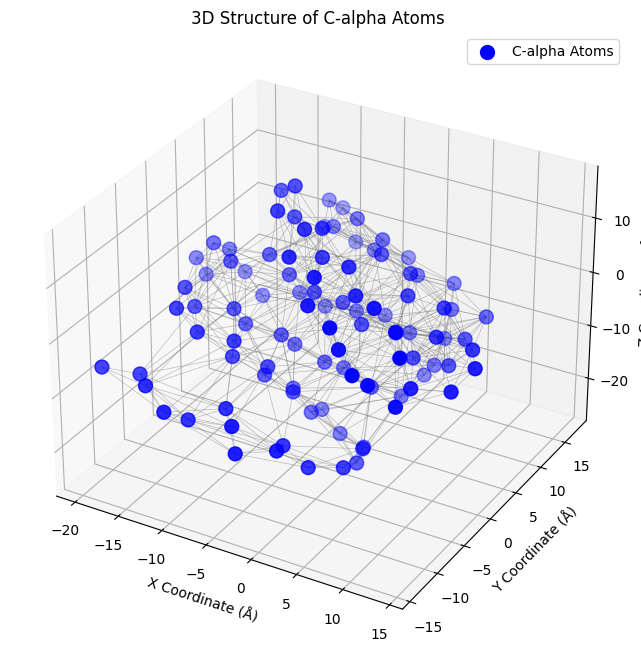

In [117]:
# Initialize a list to hold C-alpha coordinates
ca_atoms = []

# Iterate through the structure to collect C-alpha atoms
for model in structure:
    for chain in model:
        for residue in chain:
            if is_aa(residue):  # Ensure it is an amino acid
                if "CA" in residue:  # Check if the C-alpha atom exists
                    ca = residue["CA"]  # Get the C-alpha atom
                    ca_atoms.append(ca.get_coord())  # Append its coordinates

# Convert list of C-alpha coordinates to a NumPy array
caArray = np.array(ca_atoms)

# 3D Plotting
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the C-alpha atoms
ax.scatter(caArray[:, 0], caArray[:, 1], caArray[:, 2], c='b', marker='o', s=100, label='C-alpha Atoms')

# Optionally: Draw lines between each pair of C-alpha atoms to represent distances
for i in range(len(caArray)):
    for j in range(i + 1, len(caArray)):
        distance = np.linalg.norm(caArray[i] - caArray[j])
        if distance < 10:  # Optional: Only draw lines for close atoms (e.g., < 10 Å)
            ax.plot([caArray[i, 0], caArray[j, 0]], 
                    [caArray[i, 1], caArray[j, 1]], 
                    [caArray[i, 2], caArray[j, 2]], 
                    c='gray', linewidth=0.5, alpha=0.5)

# Label axes
ax.set_xlabel('X Coordinate (Å)')
ax.set_ylabel('Y Coordinate (Å)')
ax.set_zlabel('Z Coordinate (Å)')
ax.set_title('3D Structure of C-alpha Atoms')
ax.legend()

# Show the plot
plt.show()


# Prepare a protein for an autoencoder

In [118]:
# Coordinate matrix 

# Initialize a list to hold atomic coordinates
atom_coords = []

# Iterate through the structure to collect atomic coordinates
for model in structure:
    for chain in model:
        for residue in chain:
            if is_aa(residue):  # Ensure it is an amino acid
                for atom in residue:
                    atom_coords.append(atom.get_coord())  # Append its coordinates

# Convert list of atomic coordinates to a NumPy array
atom_matrix = np.array(atom_coords)

# Normalize the coordinates (optional)
atom_matrix -= atom_matrix.mean(axis=0)
atom_matrix /= atom_matrix.std(axis=0)

# Check the shape of the feature matrix
print("Atom coordinate matrix shape:", atom_matrix.shape)


Atom coordinate matrix shape: (788, 3)


In [119]:
# Distance matrix 

# Calculate the pairwise distance matrix
distance_matrix = np.linalg.norm(atom_matrix[:, None, :] - atom_matrix[None, :, :], axis=-1)

# Normalize the distance matrix (optional)
distance_matrix -= distance_matrix.mean()
distance_matrix /= distance_matrix.std()

# Check the shape of the distance matrix
print("Distance matrix shape:", distance_matrix.shape)


Distance matrix shape: (788, 788)


Atom Matrix: typically structured such that each row represents an atom, and the columns represent the features of those atoms. 

Benefits: 
- Direct Spatial Information: The atom matrix retains the actual coordinates of the atoms, which can be critical for tasks requiring precise geometric information.
- Simplicity: It provides a straightforward representation of the structural data, which can be easier to interpret and manipulate.
- Versatility: It can be directly used in various machine learning models, including convolutional neural networks (CNNs) that may learn spatial hierarchies.
- Lower Dimensionality: If you have fewer atoms in your system, the atom matrix may be less complex and easier to work with compared to a distance matrix.

Use Cases:

- Molecular dynamics simulations.
- Predictions involving atomic properties (e.g., predicting binding affinity based on atom positions).
- Applications that require understanding the molecular geometry of proteins.


Distance Matrix: square matrix where each element at position (i, j) represents the distance between atom i and atom j.

Benefits:

- Captures Relationships: The distance matrix inherently captures the spatial relationships between atoms, making it useful for understanding interactions or clustering based on proximity.
- Translation Invariance: Distance matrices are invariant to translations and rotations, making them robust for certain tasks where orientation does not matter.
- Compact Representation: For larger systems, the distance matrix can provide a more compact representation of relationships than a full atom matrix, particularly when the number of atoms is high.
- Useful for Graph-based Models: Distance matrices are often used in graph neural networks, where nodes (atoms) and edges (distances) are the primary components.

Use Cases:

- Clustering similar structures based on spatial arrangements.
- Graph-based representations of molecular structures for various machine learning applications.
- Applications where interactions based on distance (e.g., contact maps) are crucial, such as in protein folding predictions.

Combining Both Representations
In many cases, you might benefit from using both representations by concatenating them into a single feature matrix, allowing your model to learn from both absolute coordinates and relational distances.

In [121]:
# C-alpha matrix

# PDB file has been parsed, see initial cells

# Initialize a list to hold C-alpha coordinates
ca_atoms = []

# Iterate through the structure to collect C-alpha atoms
for model in structure:
    for chain in model:
        for residue in chain:
            if is_aa(residue):  # Ensure it is an amino acid
                if "CA" in residue:  # Check if the C-alpha atom exists
                    ca = residue["CA"]  # Get the C-alpha atom
                    ca_atoms.append(ca.get_coord())  # Append its coordinates

# Convert list of C-alpha coordinates to a NumPy array
ca_matrix = np.array(ca_atoms)

# Normalize the C-alpha coordinates (optional)
ca_matrix -= ca_matrix.mean(axis=0)
ca_matrix /= ca_matrix.std(axis=0)

# Check the shape of the C-alpha feature matrix
print("C-alpha matrix shape:", ca_matrix.shape)


C-alpha matrix shape: (102, 3)


A C-alpha matrix typically contains the coordinates of the C-alpha atoms of all residues in the protein. Each row corresponds to a C-alpha atom, and the columns represent its features (e.g., x, y, z coordinates)

Benefits:
- Simplicity: The C-alpha representation simplifies the protein structure by reducing the number of atoms considered. 

- Focus on Backbone Structure: The C-alpha atoms are essential for understanding the overall backbone conformation of the protein. Many structural features (like secondary structure elements) can be derived from the C-alpha coordinates.

- Reduced Complexity: For large proteins, using only C-alpha atoms reduces the dimensionality of the data, making computations more manageable while retaining crucial structural information.

- Useful for Structural Analysis: The C-alpha matrix can be particularly useful for:Secondary structure prediction, Comparative modeling, Molecular dynamics: Focusing on C-alpha atoms can reduce computational cost while still providing insights into the overall motion of the protein, distance and Angle Calculations

Use Cases for a C-alpha Matrix:

- Training Autoencoders: If you are using an autoencoder for protein structure representation or reconstruction, the C-alpha matrix can serve as an effective input representation. The autoencoder can learn to reconstruct protein conformations based on just the backbone structure.

- Machine Learning Models: C-alpha matrices are often used in various machine learning applications, such as predicting protein-ligand interactions, understanding protein dynamics, or predicting folding pathways.

- Structural Analysis: For clustering or visualizing protein conformations, the C-alpha matrix can be utilized to derive distance matrices, which can then be used in clustering algorithms or visualization techniques like t-SNE.

- Contact Maps: You can generate contact maps using the distances between C-alpha atoms to represent interactions in a more compact format. This is particularly useful in visualizing protein folding and dynamics.